# Import the library

In [1]:
import torch
from transformers import CLIPImageProcessor, CLIPVisionModel

from diffusers import AutoencoderKL, DDPMScheduler
from diffusers.utils import load_image, make_image_grid
from src.diffusers.models.referencenet.referencenet_unet_2d_condition import (
    ReferenceNetModel,
)
from src.diffusers.models.referencenet.unet_2d_condition import UNet2DConditionModel
from src.diffusers.pipelines.referencenet.pipeline_referencenet import (
    StableDiffusionReferenceNetPipeline,
)

# Create & load models

In [2]:
custom_cache_dir = "face_anon_simple/new_models"  # Change this to a directory with more space

face_model_id = "hkung/face-anon-simple"
clip_model_id = "openai/clip-vit-large-patch14"
sd_model_id = "stabilityai/stable-diffusion-2-1"

print("Start unet download")
unet = UNet2DConditionModel.from_pretrained(
    face_model_id, subfolder="unet", use_safetensors=True, cache_dir=custom_cache_dir
)
print("Finished unet download")

print("Start Reference net download")
referencenet = ReferenceNetModel.from_pretrained(
    face_model_id, subfolder="referencenet", use_safetensors=True, cache_dir=custom_cache_dir
)
print("Finished reference net download")

print("Start condition reference net download")
conditioning_referencenet = ReferenceNetModel.from_pretrained(
    face_model_id, subfolder="conditioning_referencenet", use_safetensors=True, cache_dir=custom_cache_dir
)
print("Finished condition reference net download")

vae = AutoencoderKL.from_pretrained(
    sd_model_id, subfolder="vae", use_safetensors=True, cache_dir=custom_cache_dir
)
scheduler = DDPMScheduler.from_pretrained(
    sd_model_id, subfolder="scheduler", use_safetensors=True, cache_dir=custom_cache_dir
)
feature_extractor = CLIPImageProcessor.from_pretrained(
    clip_model_id, use_safetensors=True, cache_dir=custom_cache_dir
)
image_encoder = CLIPVisionModel.from_pretrained(
    clip_model_id, use_safetensors=True, cache_dir=custom_cache_dir
)

pipe = StableDiffusionReferenceNetPipeline(
    unet=unet,
    referencenet=referencenet,
    conditioning_referencenet=conditioning_referencenet,
    vae=vae,
    feature_extractor=feature_extractor,
    image_encoder=image_encoder,
    scheduler=scheduler,
)

pipe = pipe.to("cuda")

generator = torch.manual_seed(1)

Start unet download


/projectnb/cs585bp/projects/face_anonymization_proj/.conda/face-anon-simple/lib/python3.8/site-packages/huggingface_hub/file_download.py:1142: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Finished unet download
Start Reference net download
Finished reference net download
Start condition reference net download
Finished condition reference net download


# Anonymize images with a single aligned face

Create an anonymized version of an image if the image contains a single face and that face has already been aligned similarly to those in the [FFHQ](https://github.com/NVlabs/ffhq-dataset) or [CelebA-HQ](https://github.com/tkarras/progressive_growing_of_gans) datasets.

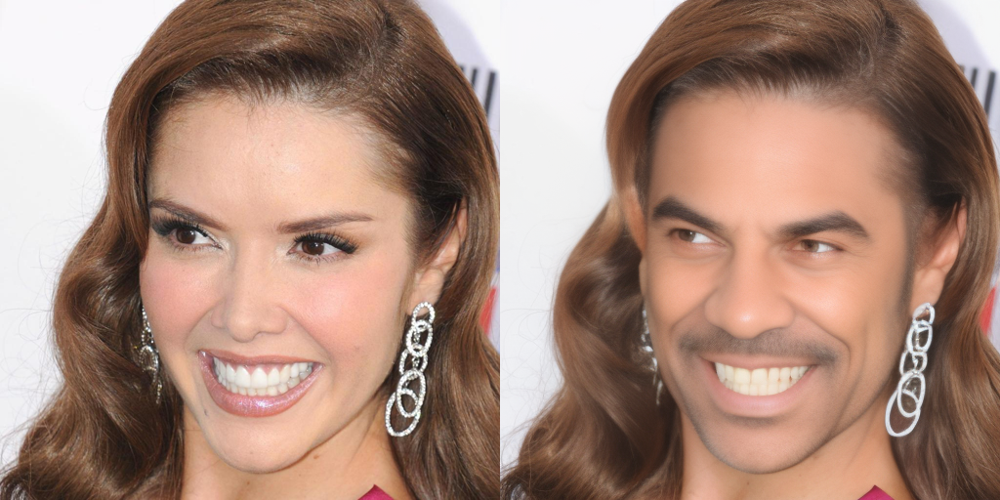

In [3]:
# get an input image for anonymization
from PIL import Image

original_image = load_image("gender_dataset/CelebA_HQ_face_gender_dataset/train/female/269.jpg")
original_image = original_image.resize((512, 512), resample=Image.BICUBIC)


# generate an image that anonymizes faces
anon_image = pipe(
    source_image=original_image,
    conditioning_image=original_image,
    num_inference_steps=5,
    guidance_scale=4.0,
    generator=generator,
    anonymization_degree=1.25,
).images[0]
make_image_grid([original_image, anon_image], rows=1, cols=2)

In [4]:
from PIL import Image
import os

# Load and preprocess original image
original_image = load_image("gender_dataset/CelebA_HQ_face_gender_dataset/train/female/269.jpg")
original_image = original_image.resize((512, 512), resample=Image.BICUBIC)

# Ensure output directory exists
output_dir = "anonymized_steps"
os.makedirs(output_dir, exist_ok=True)
torch.manual_seed(1)

# Loop over different numbers of inference steps
for steps in range(1, 26):
    anon_image = pipe(
        source_image=original_image,
        conditioning_image=original_image,
        num_inference_steps=steps,
        guidance_scale=4.0,
        generator=generator,
        anonymization_degree=1.25,
    ).images[0]

    save_path = os.path.join(output_dir, f"anon_step_{steps:02d}.png")
    anon_image.save(save_path)

    # Optionally display progress
    print(f"Saved: {save_path}")


Saved: anonymized_steps/anon_step_01.png
Saved: anonymized_steps/anon_step_02.png
Saved: anonymized_steps/anon_step_03.png
Saved: anonymized_steps/anon_step_04.png
Saved: anonymized_steps/anon_step_05.png
Saved: anonymized_steps/anon_step_06.png
Saved: anonymized_steps/anon_step_07.png
Saved: anonymized_steps/anon_step_08.png
Saved: anonymized_steps/anon_step_09.png


Saved: anonymized_steps/anon_step_10.png
Saved: anonymized_steps/anon_step_11.png
Saved: anonymized_steps/anon_step_12.png
Saved: anonymized_steps/anon_step_13.png
Saved: anonymized_steps/anon_step_14.png
Saved: anonymized_steps/anon_step_15.png
Saved: anonymized_steps/anon_step_16.png
Saved: anonymized_steps/anon_step_17.png
Saved: anonymized_steps/anon_step_18.png
Saved: anonymized_steps/anon_step_19.png
Saved: anonymized_steps/anon_step_20.png
Saved: anonymized_steps/anon_step_21.png
Saved: anonymized_steps/anon_step_22.png
Saved: anonymized_steps/anon_step_23.png
Saved: anonymized_steps/anon_step_24.png
Saved: anonymized_steps/anon_step_25.png



# Anonymize images with one or multiple unaligned faces
Create an anonymized version of an image if it contains one or more unaligned faces.

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

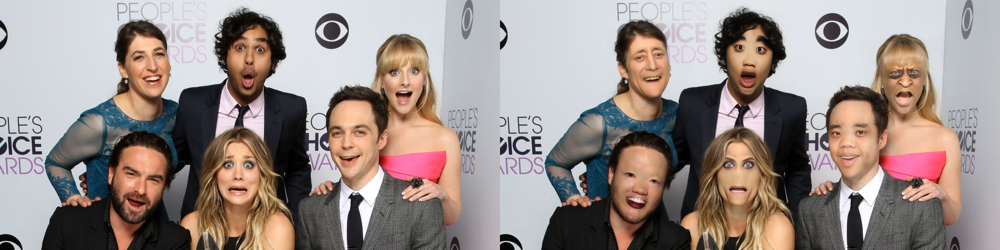

In [7]:
import face_alignment
from utils.anonymize_faces_in_image import anonymize_faces_in_image

# get an input image for anonymization
original_image = load_image("big_bang.jpeg")

# SFD (likely best results, but slower)
fa = face_alignment.FaceAlignment(
    face_alignment.LandmarksType.TWO_D, face_detector="sfd"
)

# generate an image that anonymizes faces
anon_image = anonymize_faces_in_image(
    image=original_image,
    face_alignment=fa,
    pipe=pipe,
    generator=generator,
    face_image_size=512,
    num_inference_steps=25,
    guidance_scale=4.0,
    anonymization_degree=1.5,
)
make_image_grid([original_image, anon_image], rows=1, cols=2)

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

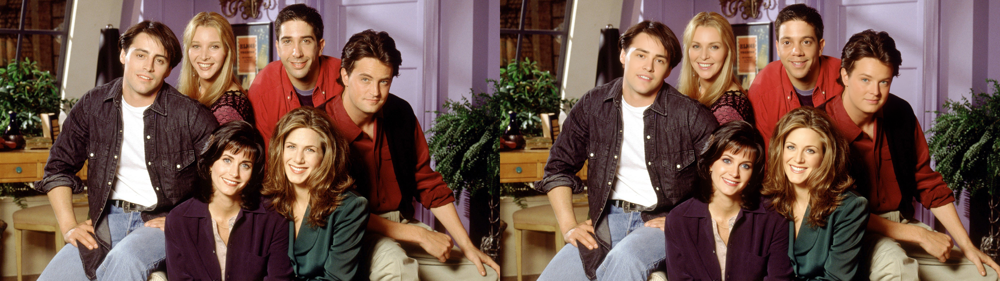

In [6]:
import face_alignment
from utils.anonymize_faces_in_image import anonymize_faces_in_image

# get an input image for anonymization
original_image = load_image("my_dataset/test/friends.jpg")

# SFD (likely best results, but slower)
fa = face_alignment.FaceAlignment(
    face_alignment.LandmarksType.TWO_D, face_detector="sfd"
)

# generate an image that anonymizes faces
anon_image = anonymize_faces_in_image(
    image=original_image,
    face_alignment=fa,
    pipe=pipe,
    generator=generator,
    face_image_size=512,
    num_inference_steps=25,
    guidance_scale=4.0,
    anonymization_degree=1.01,
)
make_image_grid([original_image, anon_image], rows=1, cols=2)

In [8]:
!nvidia-smi

Fri Mar 21 10:30:01 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.124.06             Driver Version: 570.124.06     CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla V100-SXM2-16GB           On  |   00000000:18:00.0 Off |                    0 |
| N/A   44C    P0             60W /  300W |   15048MiB /  16384MiB |      0%   E. Process |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# Swap faces between two images

In [3]:
# get source and conditioning (driving) images for face swap
source_image = load_image("my_dataset/test/friends.jpg")
conditioning_image = load_image("my_dataset/test/14795.png")

# generate an image that swaps faces
swap_image = pipe(
    source_image=source_image,
    conditioning_image=conditioning_image,
    num_inference_steps=200,
    guidance_scale=4.0,
    generator=generator,
    anonymization_degree=0.0,
).images[0]
make_image_grid([source_image, conditioning_image, swap_image], rows=1, cols=3)

OutOfMemoryError: CUDA out of memory. Tried to allocate 1014.00 MiB. GPU 0 has a total capacty of 15.77 GiB of which 72.69 MiB is free. Including non-PyTorch memory, this process has 15.69 GiB memory in use. Of the allocated memory 15.19 GiB is allocated by PyTorch, and 125.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF